In [12]:
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True) # Needed for reproducible results

Random Seed:  999


In [13]:
# Function to show an image
def imshow(img):
    img = img / 2 + 0.5  # Unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


In [14]:
# Root directory for dataset
dataroot = "gan_data/train"

# Batch size during training
batch_size = 32

# Spatial size of training images. All images will be resized to this
image_size = 128

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 128

# Size of feature maps in generator
ngf = 128

# Size of feature maps in discriminator
ndf = 128

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

2208


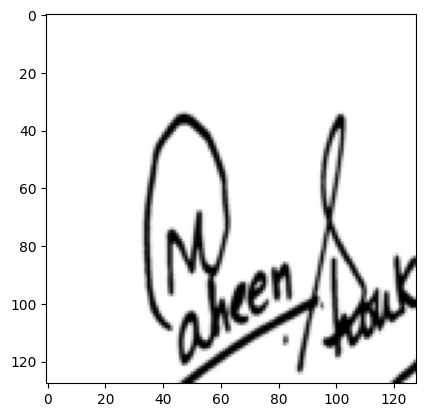

In [15]:
transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),
    transforms.Normalize(0.5,0.5)
])

rotated_transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.RandomRotation(20, fill=255),
    transforms.ToTensor(),
    transforms.Normalize(0.5,0.5)
])

translate_transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.RandomAffine(0, translate=(0.2, 0.2), fill=255),
    transforms.ToTensor(),
    transforms.Normalize(0.5,0.5)
])

dataset = dset.ImageFolder(root=dataroot, transform=transform)
rotated_dataset = dset.ImageFolder(root=dataroot, transform=rotated_transform)
translated_dataset = dset.ImageFolder(root=dataroot, transform=translate_transform)
train = torch.utils.data.ConcatDataset([dataset, rotated_dataset, translated_dataset])
dataloader = torch.utils.data.DataLoader(train, batch_size=batch_size, shuffle=True)

print(len(train))

dataiter = iter(dataloader)
images, _ = next(dataiter)

# Show images
# show if -1 to 1
imshow(images[1])

In [16]:
# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [17]:
# Generator Code
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 16, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 16),
            nn.ReLU(True),

            nn.ConvTranspose2d( ngf*16, ngf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)

In [18]:
netG = Generator().to(device)
netG.apply(weights_init)
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(128, 2048, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(2048, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Ba

Discriminator Code


In [19]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, ndf * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 16),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),
            # state size. ``(ndf*8) x 2 x 2``
            nn.Conv2d(ndf * 16, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [20]:
# Create the Discriminator
netD = Discriminator().to(device)
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(512, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Dropout(p=0.3, inplace=False)
    (12): Conv2d(1024, 2048, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias

In [21]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=0.0001, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))

In [ ]:
# Training Loop
num_epochs = 75
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        
        ## Train with all-real batch
        netD.zero_grad()
        real_imgs = data[0].to(device)
        b_size = real_imgs.size(0)
        real_label = torch.ones(b_size).uniform_(0.8, 1.0).to(device)  # label smoothing
        fake_label = torch.zeros(b_size).to(device)

        # Forward pass real batch through D
        real_out = netD(real_imgs).view(-1)
        d_real_loss = criterion(real_out, real_label)
        d_real_loss.backward()
        D_x = real_out.mean().item()

        ## Train with all-fake batch
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        fake_out = netD(fake.detach()).view(-1)
        d_fake_loss = criterion(fake_out, fake_label)
        d_fake_loss.backward()
        D_G_z1 = fake_out.mean().item()
        d_loss = d_real_loss + d_fake_loss

        # Update D
        optimizerD.step()

        netG.zero_grad()
        fake_images = netD(fake).view(-1)
        g_loss = criterion(fake_images, real_label)
        g_loss.backward()
        D_G_z2 = fake_images.mean().item()

        # Update G
        optimizerG.step()
        
        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     d_loss.item(), g_loss.item(), D_x, D_G_z1, D_G_z2))
        
        # Save Losses for plotting later
        G_losses.append(g_loss.item())
        D_losses.append(d_loss.item())
        
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1

Starting Training Loop...
[0/100][0/69]	Loss_D: 2.4530	Loss_G: 4.3385	D(x): 0.2818	D(G(z)): 0.2394 / 0.1360
[0/100][50/69]	Loss_D: 1.1864	Loss_G: 46.9354	D(x): 0.9928	D(G(z)): 0.0000 / 0.0000
[1/100][0/69]	Loss_D: 0.7741	Loss_G: 44.7147	D(x): 0.9388	D(G(z)): 0.0000 / 0.0000
[1/100][50/69]	Loss_D: 0.7020	Loss_G: 38.1994	D(x): 0.8228	D(G(z)): 0.0000 / 0.0000
[2/100][0/69]	Loss_D: 0.7513	Loss_G: 39.1623	D(x): 0.8667	D(G(z)): 0.0000 / 0.0000
[2/100][50/69]	Loss_D: 5.7875	Loss_G: 76.3087	D(x): 0.9375	D(G(z)): 0.0000 / 0.0000
[3/100][0/69]	Loss_D: 0.6234	Loss_G: 81.0094	D(x): 0.8169	D(G(z)): 0.0000 / 0.0000
[3/100][50/69]	Loss_D: 1.0111	Loss_G: 70.7885	D(x): 0.9916	D(G(z)): 0.0000 / 0.0000
[4/100][0/69]	Loss_D: 0.7973	Loss_G: 67.8479	D(x): 0.8554	D(G(z)): 0.0000 / 0.0000
[4/100][50/69]	Loss_D: 0.8422	Loss_G: 63.7309	D(x): 0.5957	D(G(z)): 0.0000 / 0.0000
[5/100][0/69]	Loss_D: 0.7001	Loss_G: 61.1531	D(x): 0.8280	D(G(z)): 0.0000 / 0.0000
[5/100][50/69]	Loss_D: 0.7118	Loss_G: 57.1952	D(x): 0.884

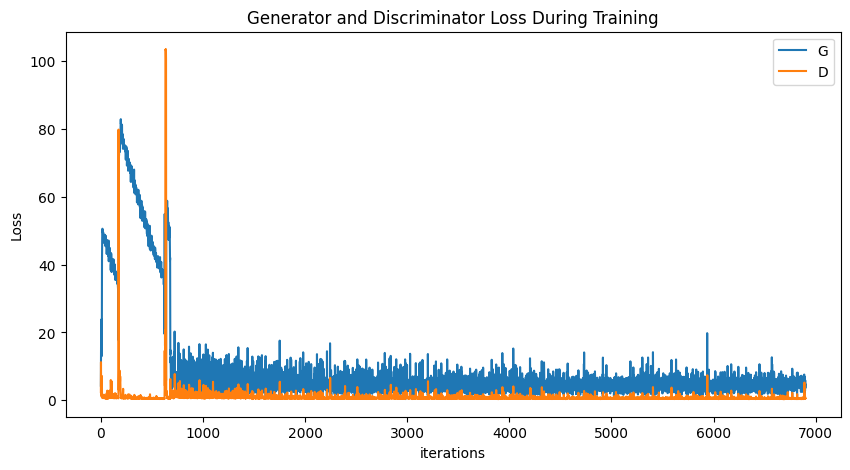

In [23]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

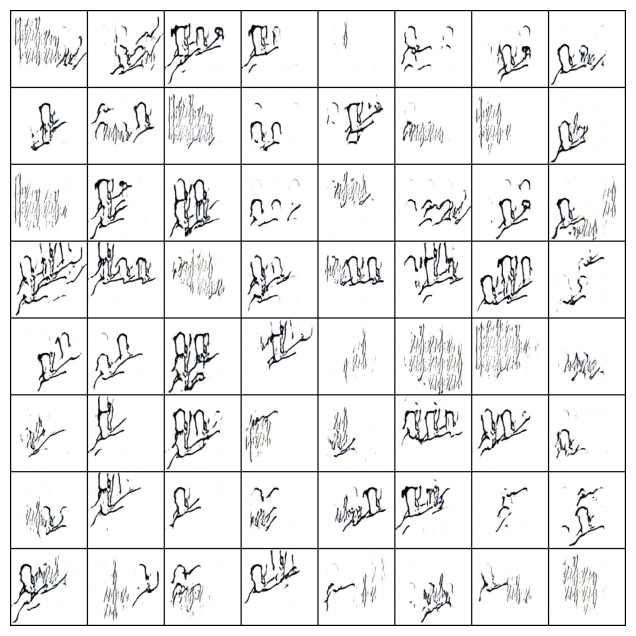

In [24]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

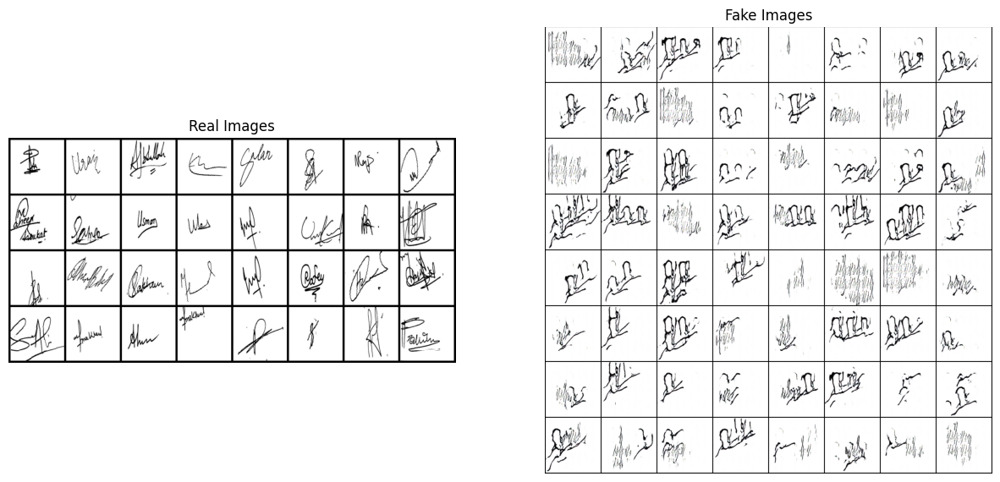

In [31]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))


In [26]:
# Save the model 
torch.save(netG.state_dict(), 'model/generator.pth')
torch.save(netD.state_dict(), 'model/discriminator.pth')

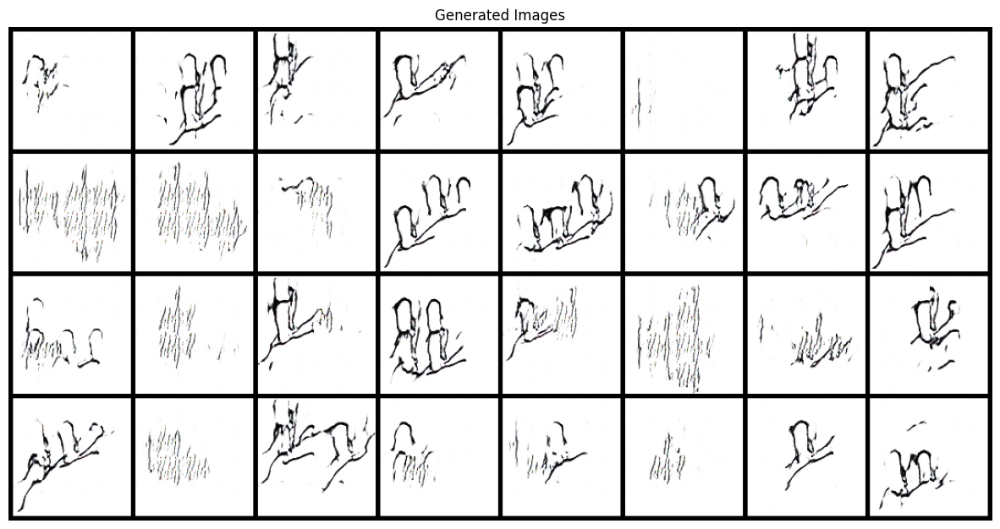

In [34]:
# Load the model
from torchviz import make_dot

netG = Generator().to(device)
netG.load_state_dict(torch.load('model/generator.pth'))
netG.eval()

# Generate some images
with torch.no_grad():
    z = torch.randn(32, nz, 1, 1, device=device)
    fake = netG(z).detach().cpu()


# Plot the fake images from the last epoch
plt.figure(figsize=(15,15))
plt.axis("off")
plt.title("Generated Images")
plt.imshow(np.transpose(vutils.make_grid(fake, padding=5, normalize=True).cpu(),(1,2,0)))

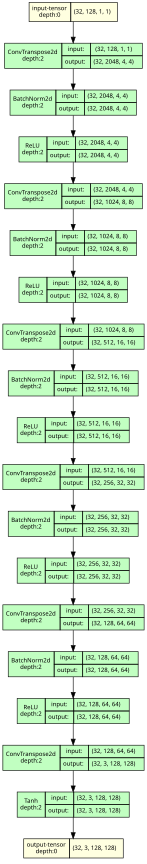

In [44]:
from torchview import draw_graph 
import graphviz

model = draw_graph(netG, (z,))
model.visual_graph


In [ ]:

model = draw_graph(netD, (fake,))
model.visual_graph